## Notes

## Imports

In [1]:
import os
import numpy as np
import librosa as lr
import pretty_midi as pm
import matplotlib.pyplot as plt
import librosa.display as display
import IPython.display as ipd

from mpl_toolkits import mplot3d

## Constants

In [2]:
DATAPOINT = "../datasets/maps/CH/" + \
            "MAPS_ISOL_CH0.1_F_SptkBGAm.wav"
MIDI_DATAPOINT = "../datasets/maps/CH/" + \
        "MAPS_ISOL_CH0.1_F_SptkBGAm.mid"
DATA_DIR = "../datasets/maps/CH/"
INPUT_NAME = "./inputs_1.dat"
EXPECT_NAME = "./expects_1.dat"

## Helpers

In [34]:
def save_mm(path, datapoint):
    mm_datapoint = np.memmap(
                        filename=path,
                        dtype='float32',
                        mode='w+',
                        shape=datapoint.shape)
    mm_datapoint[:] = datapoint[:]
    del mm_datapoint
    
def load_mm():
    NOTE_RANGE = 88
    N_BINS = 360
    HARMONICS = 6

    mm_input = np.memmap(INPUT_NAME, 
                         mode='r',
                         dtype='float32'
                        )
    mm_output = np.memmap(EXPECT_NAME, 
                          mode='r',
                          dtype='float32'
                         )
    input = np.reshape(mm_input, (-1, N_BINS, HARMONICS))
    output = np.reshape(mm_output, (-1, NOTE_RANGE))

    return input, output

In [3]:
def get_hcqt_params():
    """Hack to always use the same parameters :)
    """
    bins_per_octave = 60
    n_octaves = 6
    harmonics = [0.5, 1, 2, 3, 4, 5]
    sr = 22050
    fmin = 25.7 # 32.7
    hop_length = 256
    return bins_per_octave, n_octaves, harmonics, sr, fmin, hop_length

def compute_hcqt(path):
    (bins_per_octave, n_octaves, harmonics,
     sr, f_min, hop_length) = get_hcqt_params()
    
    y, fs = lr.load(path, sr=sr)
    
    cqt_list = []
    shapes = []
    for h in harmonics:
        cqt = lr.cqt(
                y,
                sr=fs,
                hop_length=hop_length,
                fmin=f_min*float(h),
                n_bins=bins_per_octave*n_octaves,
                bins_per_octave=bins_per_octave)
        cqt_list.append(cqt)
        shapes.append(cqt.shape)
    
    shapes_equal = [s == shapes[0] for s in shapes]
    if not all(shapes_equal):
        min_time = np.min([s[1] for s in shapes])
        new_cqt_list = []
        for i in range(len(cqt_list)):
            new_cqt_list.append(cqt_list[i][:, :min_time])
        cqt_list = new_cqt_list
        
    log_hcqt = ((1.0/80.0) * lr.core.amplitude_to_db(
        np.abs(np.array(cqt_list)), ref=np.max)) + 1.0
    return log_hcqt

## Example datapoint:

In [4]:
y, sr = lr.load(DATAPOINT)

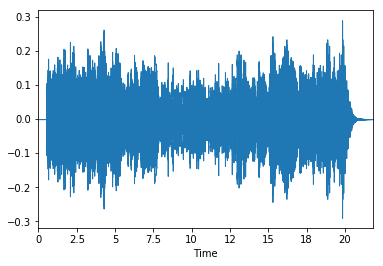

In [5]:
display.waveplot(y, sr=sr)

In [6]:
ipd.Audio(y, rate=sr)

In [7]:
log_hcqt = compute_hcqt(DATAPOINT).T

/anaconda2/lib/python2.7/site-packages/librosa/util/utils.py:1725: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  if np.issubdtype(x.dtype, float) or np.issubdtype(x.dtype, complex):
/anaconda2/lib/python2.7/site-packages/librosa/util/utils.py:1725: FutureWarning: Conversion of the second argument of issubdtype from `complex` to `np.complexfloating` is deprecated. In future, it will be treated as `np.complex128 == np.dtype(complex).type`.
  if np.issubdtype(x.dtype, float) or np.issubdtype(x.dtype, complex):


In [8]:
log_hcqt.shape

(1883, 360, 6)

In [45]:
log_hcqt = lr.util.normalize(log_hcqt)

In [46]:
reg_cqt = log_hcqt.T[:][0][:]
reg_cqt.shape

(360, 1883)

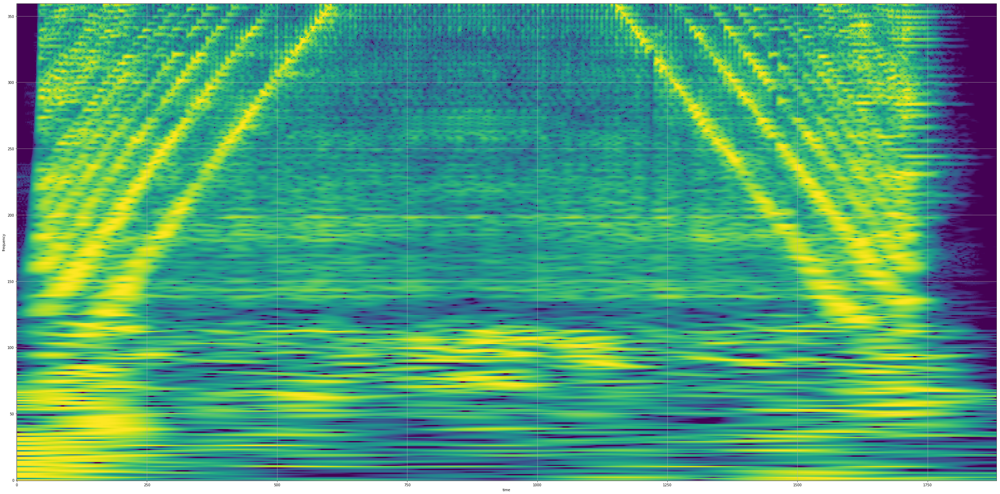

In [47]:
fig = plt.figure(figsize=(50,25))
plt.grid()
plt.imshow(reg_cqt,aspect='auto')
plt.gca().invert_yaxis()
fig.axes[0].set_xlabel('time')
fig.axes[0].set_ylabel('frequency')
plt.show()

## Load and Transform Samples

In [16]:
wavs = [d for d in os.listdir(DATA_DIR) if d.endswith('.wav')]
wavs = wavs[:3]

In [17]:
spects_and_expects = []

for w in wavs:
    wav_path = os.path.join(DATA_DIR, w)
    midi_path = os.path.join(DATA_DIR, w.replace('.wav', '.mid'))
    
    spect = lr.util.normalize(compute_hcqt(wav_path)).T
    times = lr.frames_to_time(np.arange(spect.shape[0]), sr=22050, hop_length=256.0)
    midi = pm.PrettyMIDI(midi_path)
    expect = midi.get_piano_roll(fs=22050, times=times)[21:108+1].T
    expect[expect > 0] = 1
    
    spects_and_expects.append((spect, expect))

## Visualize before and after save

In [26]:
spects_flattened = []
spects = []
expects = []
for s, e in spects_and_expects:
    spects_flattened.append(s.T[:][0][:].T)
    spects.append(s)
    expects.append(e)
spects_flattened = np.concatenate(spects_flattened)
spects = np.concatenate(spects)
expects = np.concatenate(expects)

#### Before

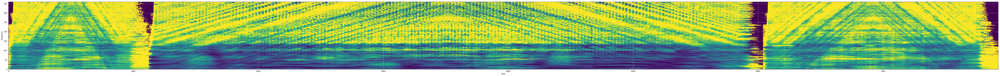

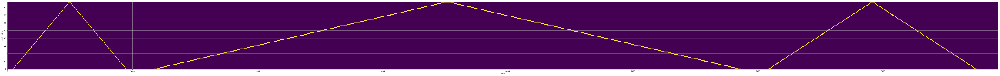

In [28]:
fig = plt.figure(figsize=(100,7))
plt.grid()
plt.imshow(spects_flattened.T ,aspect='auto')
plt.gca().invert_yaxis()
fig.axes[0].set_xlabel('time')
fig.axes[0].set_ylabel('frequency')
plt.show()
fig = plt.figure(figsize=(100,7))
plt.grid()
plt.imshow(expects.T ,aspect='auto')
plt.gca().invert_yaxis()
fig.axes[0].set_xlabel('time')
fig.axes[0].set_ylabel('midi_notes')
plt.show()

In [39]:
print spects.shape
print expects.shape
print spects.nbytes
print expects.nbytes

(7923, 360, 6)
(7923, 88)
136909440
5577792


#### Save and Load

In [35]:
save_mm(INPUT_NAME, spects)
save_mm(EXPECT_NAME, expects)
loaded_spects, loaded_expects = load_mm()

In [49]:
print loaded_spects.shape
print loaded_expects.shape
print loaded_spects.nbytes
print loaded_expects.nbytes

(7923, 360, 6)
(7923, 88)
68454720
2788896


#### After

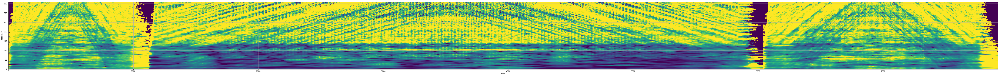

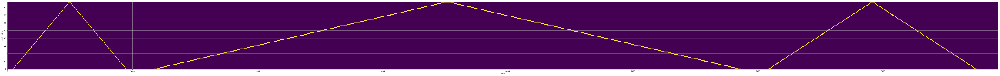

In [44]:
loaded_spects_flattened = loaded_spects.T[:][0][:]

fig = plt.figure(figsize=(100,7))
plt.grid()
plt.imshow(loaded_spects_flattened ,aspect='auto')
plt.gca().invert_yaxis()
fig.axes[0].set_xlabel('time')
fig.axes[0].set_ylabel('frequency')
plt.show()
fig = plt.figure(figsize=(100,7))
plt.grid()
plt.imshow(loaded_expects.T ,aspect='auto')
plt.gca().invert_yaxis()
fig.axes[0].set_xlabel('time')
fig.axes[0].set_ylabel('midi_notes')
plt.show()